In [1]:
import urllib.request
import netCDF4
import numpy as np
import argparse 
import datetime
import matplotlib.pyplot as plt
import cartopy.crs as ccrs	
import numpy as np 
import cartopy.feature 	
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import copy
import os
from numpy import ma  #mask smaller values       
from windspharm.standard import VectorWind
from windspharm.tools import prep_data, recover_data, order_latdim
from windspharm.examples import example_data_path
import matplotlib.path as mpath
from cartopy.util import add_cyclic_point
import pandas as pd
import statsmodels.api as sm

#My functions
import scripts.WAF as WAF
from scripts.plot import plot_WAF
from scripts.plot import fig_stereo
from scripts.plot import fig_stereo_slp
from scripts.plot import fig_robinson_slp
from scripts.plot import plot_carree

ModuleNotFoundError: No module named 'netCDF4'

In [2]:
#Open data
import xarray as xr
data = xr.open_dataset('/Users/juliamindlin/Desktop/Southern_Ocean_Cooling/ERA5/vars_200hPa_T42.nc').fillna(0)
data_slp = xr.open_dataset('/Users/juliamindlin/Desktop/Southern_Ocean_Cooling/ERA5/slp_T42.nc').fillna(0)
data_sst = xr.open_dataset('/Users/juliamindlin/Desktop/Southern_Ocean_Cooling/ERA5/sst_meanmon_remap.nc').fillna(0)


In [11]:
def season(ds):
    # (3) using where and rolling
    # mask other months with nan
    ds_DJF = ds.where(ds['time.season'] == 'DJF')
    # rolling mean -> only Jan is not nan
    # however, we loose Jan/ Feb in the first year and Dec in the last
    ds_DJF = ds_DJF.rolling(min_periods=3, center=True, time=3).mean()
    # make annual mean
    ds_DJF = ds_DJF.groupby('time.year').mean('time')
    ds_DJF = ds_DJF.rename({'year':'time'})
    return ds_DJF

def annual_mean(ds):
    # rolling mean 
    ds_annual = ds.rolling(min_periods=12, center=True, time=12).mean()
    # make annual mean
    ds_annual = ds_annual.groupby('time.year').mean('time')
    ds_annual = ds_annual.rename({'year':'time'})
    return ds_annual

def linear_regression(x):
    years = np.arange(0,len(x),1)
    df = pd.DataFrame({'years':years})
    regressors_out = sm.add_constant(df.values)
    res = sm.OLS(x,regressors_out).fit()
    returns = [res.params[i] for i in range(len(res.params))]
    return tuple(returns)

def linear_detrend(x):
    years = np.arange(0,len(x),1)
    df = pd.DataFrame({'years':years})
    regressors_out = sm.add_constant(df.values)
    res = sm.OLS(x,regressors_out).fit()
    returns = [res.params[i] for i in range(len(res.params))]
    out = x - res.params[0] - res.params[1]*years
    return out

In [12]:
data_sst_anom = data_sst.groupby('time.month') - data_sst.groupby('time.month').mean(dim='time')
data_slp_anom = data_slp.groupby('time.month') - data_slp.groupby('time.month').mean(dim='time')
data_anom = data.groupby('time.month') - data.groupby('time.month').mean(dim='time')


In [13]:
#Seasonal data
data_annual = annual_mean(data_anom)
data_slp_annual = annual_mean(data_slp_anom)
data_sst_annual = annual_mean(data_sst_anom)

In [14]:
# Funcion corriente
uwnd, uwnd_info = prep_data(data_annual.u.isel(expver=0).values, 'tyx')
vwnd, vwnd_info = prep_data(data_annual.v.isel(expver=0).values, 'tyx')

# It is also required that the latitude dimension is north-to-south. Again the
# bundled tools make this easy.
lats = data.lat
lats, uwnd, vwnd = order_latdim(lats, uwnd, vwnd)

# Create a VectorWind instance to handle the computation of streamfunction and
# velocity potential.
w = VectorWind(uwnd, vwnd)

# Compute the streamfunction and velocity potential. Also use the bundled
# tools to re-shape the outputs to the 4D shape of the wind components as they
# were read off files.
sf_annual, vp_annual = w.sfvp()


In [15]:

uwnd_clim = data.sel(time=slice('2020','2022')).mean(dim='time').u.values
vwnd_clim = data.sel(time=slice('2020','2022')).mean(dim='time').v.values

uwnd = xr.apply_ufunc(linear_regression,data.sel(time=slice('1980','2022')).isel(expver=0).u,input_core_dims=[["time"]],
                                 output_core_dims=[[],[]],
                                 vectorize=True,
                                 dask="parallelized")
vwnd = xr.apply_ufunc(linear_regression,data.sel(time=slice('1980','2022')).isel(expver=0).v,input_core_dims=[["time"]],
                                 output_core_dims=[[],[]],
                                 vectorize=True,
                                 dask="parallelized")

#uwnd = (data.sel(time=slice('2020','2022')).mean(dim='time') - data.sel(time=slice('1950','1972')).mean(dim='time')).u.values
#vwnd = (data.sel(time=slice('2020','2022')).mean(dim='time') - data.sel(time=slice('1950','1972')).mean(dim='time')).v.values

lons = data.lon.values
lats =  data.lat.values

In [16]:
slp_change = (data_slp.sel(time=slice('2020','2022')).mean(dim='time') - data_slp.sel(time=slice('1950','1972')).mean(dim='time')).msl.values
z200_change = (data.sel(time=slice('2020','2022')).mean(dim='time') - data.sel(time=slice('1950','1972')).mean(dim='time')).z.values
slp_trend = xr.apply_ufunc(linear_regression,data_slp_annual.sel(time=slice('1980','2022')).isel(expver=0).msl,input_core_dims=[["time"]],
                                 output_core_dims=[[],[]],
                                 vectorize=True,
                                 dask="parallelized")
z200_trend = xr.apply_ufunc(linear_regression,data_annual.sel(time=slice('1980','2022')).isel(expver=0).z,input_core_dims=[["time"]],
                                 output_core_dims=[[],[]],
                                 vectorize=True,
                                 dask="parallelized")
sst_trend = xr.apply_ufunc(linear_regression,data_sst_annual.sel(time=slice('1980','2022')).sst,input_core_dims=[["time"]],
                                 output_core_dims=[[],[]],
                                 vectorize=True,
                                 dask="parallelized")

In [17]:
z200_detrend = xr.apply_ufunc(linear_detrend,data.sel(time=slice('1980','2022')).isel(expver=0).z,input_core_dims=[["time"]],
                                 output_core_dims=[["time"]],
                                 vectorize=True,
                                 dask="parallelized")

In [45]:
def plot_WAF(lon,lat,psiaa,py,px,path,clevs=np.arange(-2.5e7,2.75e7,0.25e7),title='Cambio 1950-1972 vs 2000-2022 en Función Corriente 200hPa y Flujos de Plumb asociados'):
    fig1 = plt.figure(figsize=(16, 11)) 
    
    ax = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))
    crs_latlon = ccrs.PlateCarree()
    #Pasamos las latitudes/longitudes del dataset a una reticula para graficar
    lons, lats = np.meshgrid(lon,lat)
    cmap = copy.copy(plt.cm.get_cmap("RdBu")) 
    
    ax.set_extent([0, 359, -88, 40], crs=crs_latlon)
    im=ax.contourf(lons, lats, psiaa[0, :, :], clevs, transform=crs_latlon, cmap=cmap, extend='both')
    
    cmap.set_under(cmap(0))
    cmap.set_over(cmap(cmap.N-1))
    # add colorbar
    #cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.7,aspect=12)#,"right")
    cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.3,aspect=12)#,"right")
    #legend
    cbar.set_label('$m^{2}/s$/yr')    

    ax.add_feature(cartopy.feature.COASTLINE)
    ax.add_feature(cartopy.feature.BORDERS, linestyle='-', alpha=.5)
    ax.gridlines(crs=crs_latlon, linewidth=0.3, linestyle='-')
    ax.set_xticks(np.linspace(0, 360,  7), crs=crs_latlon)
    ax.set_yticks(np.linspace(-80, 10,  10), crs=crs_latlon)      
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
   
    #contoour levels
    ax.contour(lons, lats, psiaa[0, :, :], clevs, colors='k', linewidths=0.5, transform=crs_latlon)
       #print title
    ax.set_title('Anomalías Función Corriente 200hPa')
    
    #save figure - tight option adjuts paper size to figure
    #fig1.savefig(path+'/'+'FunciónCorriente200hPa_1950-1972vs2000-2022.png',dpi=300,bbox_inches='tight',orientation='landscape')
    
    #plot plumb fluxes and save again
    #mask wind data to only show the 40% stronger fluxes.
    Q60=np.percentile(np.sqrt(np.add(np.power(px,2),np.power(py,2))),60) 
    M = np.sqrt(np.add(np.power(px,2),np.power(py,2))) < Q60
    #mask array
    px_mask = ma.array(px,mask = M)
    py_mask = ma.array(py,mask = M)
    #plot vectors
    ax.quiver(lons[2:-1:2,2:-1:2], lats[2:-1:2,2:-1:2], px_mask[0,2:-1:2,2:-1:2],
              py_mask[0,2:-1:2,2:-1:2], width=1e-3, headwidth=3,#headwidht (default3)
                       headlength=2.2, transform=crs_latlon)  # (default5))	      
    ax.set_title(title)
    
    #save figure
    fig1.savefig(path+'/'+'FunciónCorriente200hPaFlujosPlumb_1950-1972vs2000-2022.png',dpi=300,bbox_inches='tight',orientation='landscape')
    
    
def add_box(box,texto,color='black',text_color='black'):
    x_start, x_end = box[0], box[1]
    y_start, y_end = box[2], box[3]
    margin = 0.0007
    margin_fractions = np.array([margin, 1.0 - margin])
    x_lower, x_upper = x_start + (x_end - x_start) * margin_fractions
    y_lower, y_upper = y_start + (y_end - y_start) * margin_fractions
    box_x_points = x_lower + (x_upper - x_lower) * np.array([0, 1, 1, 0, 0])
    box_y_points = y_lower + (y_upper - y_lower) * np.array([0, 0, 1, 1, 0])
    plt.plot(box_x_points, box_y_points, transform=ccrs.PlateCarree(),linewidth=2.5, color=color, linestyle='-')
    plt.text(x_start + (x_end - x_start)*0.2, y_start + (y_end - y_start)*0.6, texto,transform=ccrs.PlateCarree( ),color=text_color)


def plot_carree(boxes,lon,lat,var,clevs,cmap,title,units,path):
    fig1 = plt.figure(figsize=(16, 11)) 
    
    ax = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))
    crs_latlon = ccrs.PlateCarree()
    #Pasamos las latitudes/longitudes del dataset a una reticula para graficar
    lons, lats = np.meshgrid(lon,lat)
    
    ax.set_extent([0, 359, -88, 40], crs=crs_latlon)
    im=ax.contourf(lons, lats, var[:, :], clevs, transform=crs_latlon, cmap=cmap, extend='both')
    
    # add colorbar
    #cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.7,aspect=12)#,"right")
    cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.3,aspect=12)#,"right")
    #legend
    cbar.set_label(units)    
    for box in boxes:
        add_box(box,texto=' ',color='red')
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.add_feature(cartopy.feature.BORDERS, linestyle='-', alpha=.5)
    ax.gridlines(crs=crs_latlon, linewidth=0.3, linestyle='-')
    ax.set_xticks(np.linspace(0, 360,  7), crs=crs_latlon)
    ax.set_yticks(np.linspace(-80, 10,  10), crs=crs_latlon)      
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
   
    #contoour levels
    ax.contour(lons, lats, var[:, :], clevs, colors='k', linewidths=0.5, transform=crs_latlon)
       #print title
    ax.set_title(title)
    
    #save figure - tight option adjuts paper size to figure
    fig1.savefig(path+'/'+title+'.png',dpi=300,bbox_inches='tight',orientation='landscape')


def plot_carree_cortada(boxes,lon,lat,var,var2,clevs,clevs2,cmap,title,units,path):
    fig1 = plt.figure(figsize=(16, 11)) 
    
    ax = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))
    crs_latlon = ccrs.PlateCarree()
    #Pasamos las latitudes/longitudes del dataset a una reticula para graficar
    lons, lats = np.meshgrid(lon,lat)
    
    ax.set_extent([120, 320, -88, 0], crs=crs_latlon)
    im=ax.contourf(lons, lats, var[:, :], clevs, transform=crs_latlon, cmap=cmap, extend='both')
    
    # add colorbar
    #cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.7,aspect=12)#,"right")
    cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.3,aspect=12)#,"right")
    #legend
    cbar.set_label(units)
    for box in boxes:
        add_box(box,texto=' ',color='red')
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.add_feature(cartopy.feature.BORDERS, linestyle='-', alpha=.5)
    ax.gridlines(crs=crs_latlon, linewidth=0.3, linestyle='-')
    ax.set_xticks(np.linspace(120, 320,  7), crs=crs_latlon)
    ax.set_yticks(np.linspace(-80, 0,  9), crs=crs_latlon)      
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
   
    #contoour levels
    ax.contour(lons, lats, var2[:, :], clevs2, colors='k', linewidths=1.5, transform=crs_latlon)
       #print title
    ax.set_title(title)
    
    #save figure - tight option adjuts paper size to figure
    fig1.savefig(path+'/'+title+'.png',dpi=300,bbox_inches='tight',orientation='landscape')

In [21]:
[lon,lat,vp]=WAF.VP_func(lons,lats,uwnd[1].values.reshape(1,64,128),vwnd[1].values.reshape(1,64,128),uwnd_clim,vwnd_clim)

/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/scripts/WAF.py:179: RuntimeWarning: divide by zero encountered in divide
  coeff1 = np.transpose(np.tile(coslat,(nlons,1)))*(0.2101)/(2*magU)
/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/scripts/WAF.py:181: RuntimeWarning: invalid value encountered in multiply
  px = coeff1/(a*a*np.transpose(np.tile(coslat,(nlons,1))))*( uclm*termxu/np.transpose(np.tile(coslat,(nlons,1))) + vclm*termxv)
/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/scripts/WAF.py:183: RuntimeWarning: invalid value encountered in multiply
  py = coeff1/(a*a)*( uclm/np.transpose(np.tile(coslat,(nlons,1)))*termxv + vclm*termyv)


In [22]:
[lon,lat,psiaa,px,py]=WAF.WAF_func(lons,lats,uwnd[1].values.reshape(1,64,128),vwnd[1].values.reshape(1,64,128),uwnd_clim,vwnd_clim)

/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/scripts/WAF.py:111: RuntimeWarning: divide by zero encountered in divide
  coeff1 = np.transpose(np.tile(coslat,(nlons,1)))*(0.2101)/(2*magU)
/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/scripts/WAF.py:113: RuntimeWarning: invalid value encountered in multiply
  px = coeff1/(a*a*np.transpose(np.tile(coslat,(nlons,1))))*( uclm*termxu/np.transpose(np.tile(coslat,(nlons,1))) + vclm*termxv)
/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/scripts/WAF.py:115: RuntimeWarning: invalid value encountered in multiply
  py = coeff1/(a*a)*( uclm/np.transpose(np.tile(coslat,(nlons,1)))*termxv + vclm*termyv)


/var/folders/_j/djvzvp5n6pscgg9ndg0432pw0000gq/T/ipykernel_66909/3612707096.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy.copy(plt.cm.get_cmap("RdBu"))


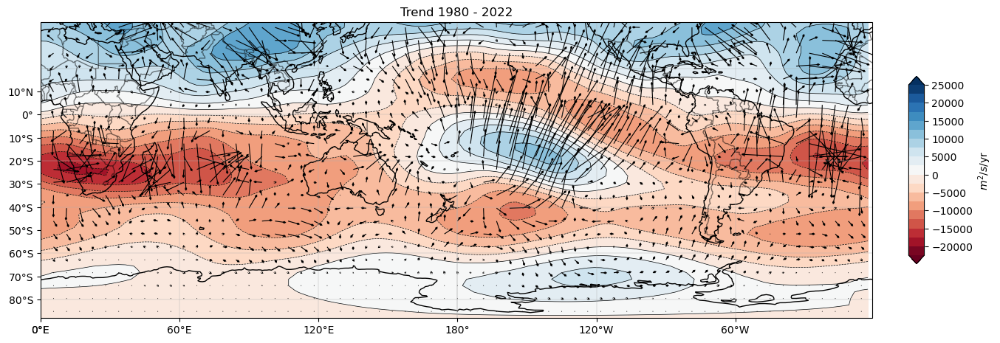

In [23]:
path = '/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend1980-2022_annual'
plot_WAF(lon,lat,psiaa,py,px,path,clevs=np.arange(-2.25e4,2.75e4,0.25e4),title='Trend 1980 - 2022')

/var/folders/_j/djvzvp5n6pscgg9ndg0432pw0000gq/T/ipykernel_66909/1059867857.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy.copy(plt.cm.get_cmap("RdBu"))
/Users/juliamindlin/mambaforge/envs/esmvaltool/lib/python3.10/site-packages/matplotlib/quiver.py:646: RuntimeWarning: divide by zero encountered in scalar divide
  length = a * (widthu_per_lenu / (self.scale * self.width))
/Users/juliamindlin/mambaforge/envs/esmvaltool/lib/python3.10/site-packages/matplotlib/quiver.py:646: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))


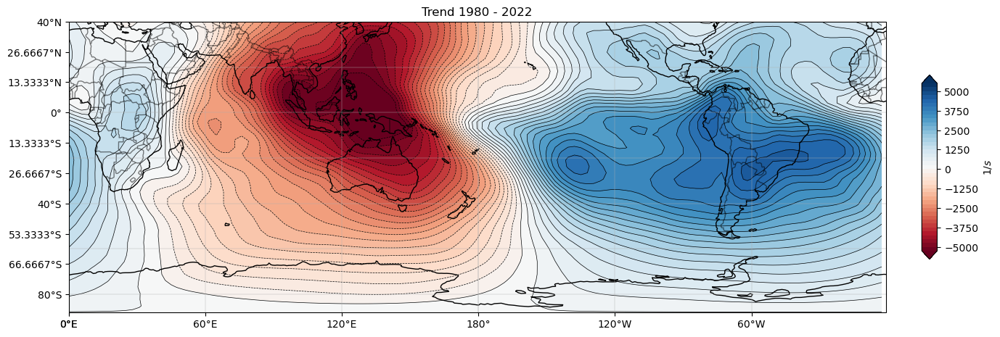

In [41]:

def plot_WAF(lon,lat,psiaa,py,px,path,clevs=np.arange(-2.5e7,2.75e7,0.25e7),title='Cambio 1950-1972 vs 2000-2022 en Función Corriente 200hPa y Flujos de Plumb asociados',unit='$m^{2}/s$'):
    fig1 = plt.figure(figsize=(16, 11)) 
    
    ax = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))
    crs_latlon = ccrs.PlateCarree()
    #Pasamos las latitudes/longitudes del dataset a una reticula para graficar
    lons, lats = np.meshgrid(lon,lat)
    cmap = copy.copy(plt.cm.get_cmap("RdBu")) 
    
    ax.set_extent([0, 359, -88, 40], crs=crs_latlon)
    im=ax.contourf(lons, lats, psiaa[0, :, :], clevs, transform=crs_latlon, cmap=cmap, extend='both')
    
    cmap.set_under(cmap(0))
    cmap.set_over(cmap(cmap.N-1))
    # add colorbar
    #cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.7,aspect=12)#,"right")
    cbar = plt.colorbar(im, fraction=0.052, pad=0.04,shrink=0.3,aspect=12)#,"right")
    #legend
    cbar.set_label(unit)    

    ax.add_feature(cartopy.feature.COASTLINE)
    ax.add_feature(cartopy.feature.BORDERS, linestyle='-', alpha=.5)
    ax.gridlines(crs=crs_latlon, linewidth=0.3, linestyle='-')
    ax.set_xticks(np.linspace(0, 360,  7), crs=crs_latlon)
    ax.set_yticks(np.linspace(-80, 40,  10), crs=crs_latlon)      
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
   
    #contoour levels
    ax.contour(lons, lats, psiaa[0, :, :], clevs, colors='k', linewidths=0.5, transform=crs_latlon)
       #print title
    ax.set_title('Anomalías Función Corriente 200hPa')
    
    #save figure - tight option adjuts paper size to figure
    #fig1.savefig(path+'/'+'FunciónCorriente200hPa_1950-1972vs2000-2022.png',dpi=300,bbox_inches='tight',orientation='landscape')
    
    #plot plumb fluxes and save again
    #mask wind data to only show the 40% stronger fluxes.
    Q60=np.percentile(np.sqrt(np.add(np.power(px,2),np.power(py,2))),60) 
    M = np.sqrt(np.add(np.power(px,2),np.power(py,2))) < Q60
    #mask array
    px_mask = ma.array(px,mask = M)
    py_mask = ma.array(py,mask = M)
    #plot vectors
    ax.quiver(lons[2:-1:2,2:-1:2], lats[2:-1:2,2:-1:2], px_mask[0,2:-1:2,2:-1:2],
              py_mask[0,2:-1:2,2:-1:2], width=1e-3, headwidth=3,#headwidht (default3)
                       headlength=2.2, transform=crs_latlon)  # (default5))	      
    ax.set_title(title)
 
 
path = '/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend1980-2022_annual'
plot_WAF(lon,lat,vp,py*0,px*0,path,clevs=np.arange(-5.25e3,5.75e3,0.25e3),title='Trend 1980 - 2022',unit='$1/s$')

In [21]:
fig_stereo_slp2(lon,lat,-10,psiaa[0,:,:],np.arange(-2e5,2.25e5,0.25e4),'Función Corriente 200hPa \n 1950-1972 vs 2000-2022','$m^{2}/s$/yr','/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend',cmap='RdBu')

NameError: name 'fig_stereo_slp2' is not defined

In [13]:
fig_stereo_slp2(lon,lat,-10,slp_trend[1],np.arange(-10,12,2),'Mean Sea Level Pressure \n trend 1980 - 2022','hPa/yr','/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend1980-2022')

NameError: name 'fig_stereo_slp2' is not defined

In [59]:
fig_stereo_slp2(lon,lat,-10,z200_trend[1].sel(month=1),np.arange(-15,20,5),'Geopotential height at 200 hPa \n 1980-2022','m/yr','/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend1980-2022_annual')

NameError: name 'fig_stereo_slp2' is not defined

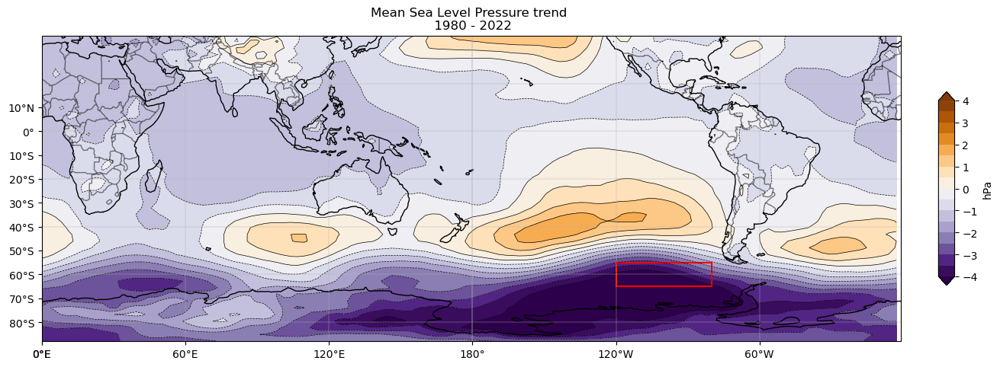

In [33]:
plot_carree([[240,280,-65,-55]],lon,lat,slp_trend[1]*43/100,np.arange(-4,4.5,.5),'PuOr_r','Mean Sea Level Pressure trend \n 1980 - 2022','hPa','/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend1980-2022_annual')

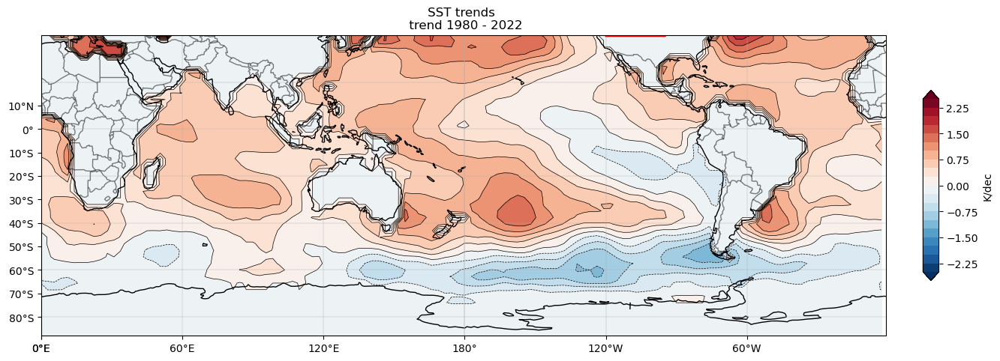

In [47]:
plot_carree([[240,265,40,50],[190,210,43,50]],lon,lat,sst_trend[1]*43,np.arange(-2.5,2.75,.25),'RdBu_r','SST trends \n trend 1980 - 2022','K/dec',path)

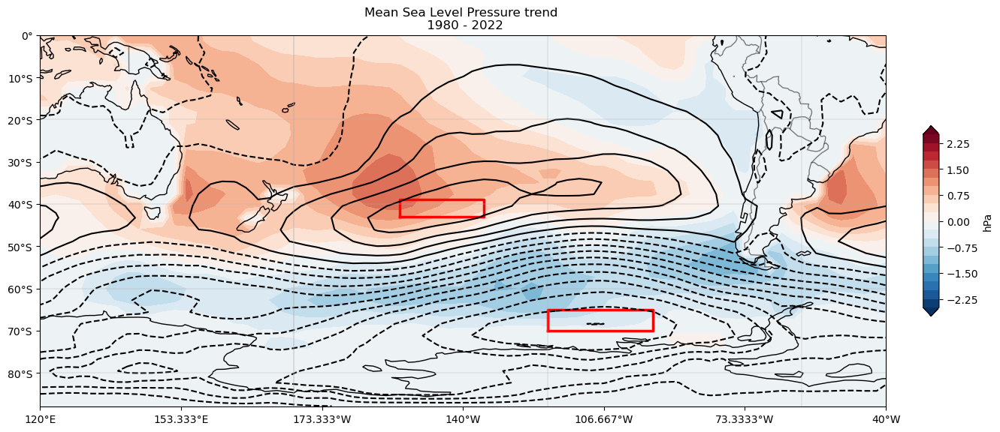

In [46]:
plot_carree_cortada([[240,265,-70,-65],[205,225,-43,-39]],lon,lat,sst_trend[1]*43,slp_trend[1]*43/100,np.arange(-2.5,2.75,.25),np.arange(-5.5,6,.5),'RdBu_r','Mean Sea Level Pressure trend \n 1980 - 2022','hPa','/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_trend1980-2022_annual')

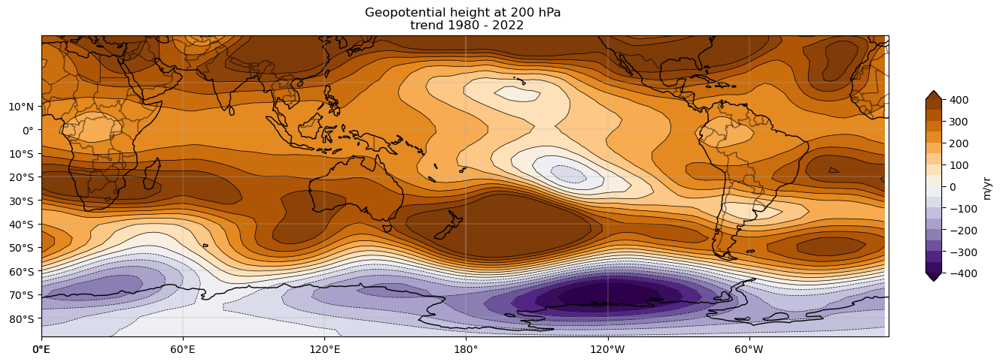

In [69]:
plot_carree(lon,lat,z200_trend[1]*43,np.arange(-400,450,50),'PuOr_r','Geopotential height at 200 hPa \n trend 1980 - 2022','m/yr',path)

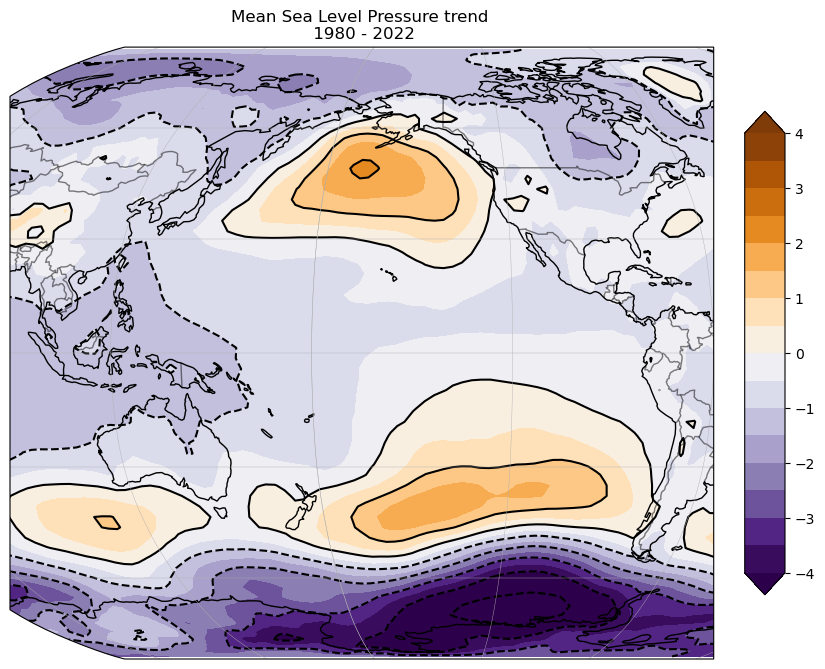

In [72]:
fig_robinson_slp(lon,lat,np.arange(-4,4.5,.5),slp_trend[1]*43/100,'Mean Sea Level Pressure trend \n 1980 - 2022')
#hPa/decade

## EOF analysis

### funciones

In [11]:
from scipy import signal 
from eofs.xarray import Eof
def eof_solver(data):
    # Create an EOF solver to do the EOF analysis. Square-root of cosine of
    # latitude weights are applied before the computation of EOFs.
    coslat = np.cos(np.deg2rad(data['lat'].values))
    coslat[0]=0
    coslat[len(data['lat'])-1] = 0
    wgts = np.sqrt(coslat)[..., np.newaxis]

    #Calculo componente principal   
    solver = Eof(data, weights=wgts)
    # Retrieve the leading EOF, expressed as the correlation between the leading
    # PC time series and the input anomalies at each grid point, and the
    # leading PC time series itself.
    eof1 = solver.eofsAsCorrelation(neofs=6)
    pc1 = solver.pcs(npcs=6, pcscaling=1)

    return eof1, pc1

def eof_solver_manual(dato,var):
    #Create an EOF solver through SVD. Square-root of cosine of
    # latitude weights are applied before the computation of EOFs.
    M = np.zeros([int(len(dato.lat)*len(dato.lon)), len(dato.time)])
    cont = 0
    for i in range(len(dato.lat)):
        for j in range(len(dato.lon)):
            if (dato.lat[i].values == 0) or (dato.lat[i].values == 90):
                coslat = 0
                time_evolution_ij = np.nan_to_num(dato[var].values[:,i,j],0) 
                M[cont] =  signal.detrend(time_evolution_ij) * np.sqrt(coslat)
                cont += 1
            else:
                coslat = np.cos(np.deg2rad(dato.lat[i].values))
                time_evolution_ij = np.nan_to_num(dato[var].values[:,i,j],0) 
                M[cont] =  signal.detrend(time_evolution_ij) * np.sqrt(coslat)
                cont += 1

    N = M.T
    U, s, VT = np.linalg.svd(N)
    S = np.zeros((N.shape[0], N.shape[1]))
    S[:N.shape[0], :N.shape[0]] = np.diag(s)
    PC = U.dot(S)
    return VT, PC
    
def VT_to_EOF_pattern(data,vt,n):
    eof_pattern = np.zeros((len(data.lat),len(data.lon)))
    cont = 0
    for i in range(len(data.lat)):
        for j in range(len(data.lon)):
            eof_pattern[i,j] = vt[n-1,cont]
            cont += 1

    return eof_pattern

def fig_stereo_eofs(lon,lat,latr,eofs,clevels,title,units,box,path,cmap='PuOr_r'):

    fig = plt.figure(figsize=(20, 10)) 
      
    for k in range(len(eofs.mode)):
        anomvar = eofs.isel(mode=k)
        ax = plt.subplot(2,3,k+1,projection=ccrs.SouthPolarStereo(central_longitude=240))
        #Pasamos las latitudes/longitudes del dataset a una reticula para graficar
        lons, lats = np.meshgrid(np.append(lon,360),lat)
        #clevs = np.arange(-int(levcont),int(levcont)+int(levint),int(levint))
        crs_latlon = ccrs.PlateCarree()
        ax.set_extent([0,359.9, -90, int(latr)], crs=crs_latlon)
        # Compute a circle in axes coordinates, which we can use as a boundary
        # for the map. We can pan/zoom as much as we like - the boundary will be
        # permanently circular.
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        maximo = np.max(np.squeeze(anomvar))
        minimo = np.min(np.squeeze(anomvar))
        limite = np.max([np.abs(minimo),np.abs(maximo)])
        #clevels = np.arange(-limite,(limite+limite*2/10),limite*2/10)
        ax.set_boundary(circle, transform=ax.transAxes)
        im=ax.contourf(lons, lats, add_cyclic_point(anomvar),levels=clevels,transform=crs_latlon,cmap=cmap,extend='both')
        ax.contour(lons, lats, add_cyclic_point(anomvar),levels=clevels,colors='k',transform=crs_latlon,extend='both')  
        add_box(box,texto=' ',color='red')   
        cbar = plt.colorbar(im,fraction=0.052, pad=0.04,shrink=0.8,aspect=12)
        cbar.set_label(units)
        ax.add_feature(cartopy.feature.COASTLINE)
        ax.add_feature(cartopy.feature.BORDERS, linestyle='-', alpha=.5)
        ax.gridlines(crs=crs_latlon, linewidth=0.3, linestyle='-')
        ax.set_title('EOF #'+str(k+1))
    #Save in jpg
    plt.savefig(path+'/'+title+'.png',dpi=300,bbox_inches='tight',orientation='landscape')

def fig_stereo_slp2(lon,lat,latr,anomvar,clevels,title,units,box,path,cmap='PuOr_r'):

   fig = plt.figure(figsize=(10, 10)) 
      
   ax = plt.subplot(projection=ccrs.SouthPolarStereo(central_longitude=240))

   #Pasamos las latitudes/longitudes del dataset a una reticula para graficar
   lons, lats = np.meshgrid(np.append(lon,360),lat)
   #clevs = np.arange(-int(levcont),int(levcont)+int(levint),int(levint))
   crs_latlon = ccrs.PlateCarree()
   ax.set_extent([0,359.9, -90, int(latr)], crs=crs_latlon)
   # Compute a circle in axes coordinates, which we can use as a boundary
   # for the map. We can pan/zoom as much as we like - the boundary will be
   # permanently circular.
   theta = np.linspace(0, 2*np.pi, 100)
   center, radius = [0.5, 0.5], 0.5
   verts = np.vstack([np.sin(theta), np.cos(theta)]).T
   circle = mpath.Path(verts * radius + center)
   maximo = np.max(np.squeeze(anomvar))
   minimo = np.min(np.squeeze(anomvar))
   limite = np.max([np.abs(minimo),np.abs(maximo)])
   #clevels = np.arange(-limite,(limite+limite*2/10),limite*2/10)
   ax.set_boundary(circle, transform=ax.transAxes)
   im=ax.contourf(lons, lats, add_cyclic_point(anomvar),levels=clevels,transform=crs_latlon,cmap=cmap,extend='both')
   ax.contour(lons, lats, add_cyclic_point(anomvar),levels=clevels,colors='k',transform=crs_latlon,extend='both')     
   add_box(box,texto=' ')
   cbar = plt.colorbar(im,fraction=0.052, pad=0.04,shrink=0.8,aspect=12)
   cbar.set_label(units)
   ax.add_feature(cartopy.feature.COASTLINE)
   ax.add_feature(cartopy.feature.BORDERS, linestyle='-', alpha=.5)
   ax.gridlines(crs=crs_latlon, linewidth=0.3, linestyle='-')
   ax.set_title(title)
   #Save in jpg
   plt.savefig(path+'/'+title+'.png',dpi=300,bbox_inches='tight',orientation='landscape')
   
def add_box(box,texto,color='black',text_color='black'):
    x_start, x_end = box[0], box[1]
    y_start, y_end = box[2], box[3]
    margin = 0.0007
    margin_fractions = np.array([margin, 1.0 - margin])
    x_lower, x_upper = x_start + (x_end - x_start) * margin_fractions
    y_lower, y_upper = y_start + (y_end - y_start) * margin_fractions
    box_x_points = x_lower + (x_upper - x_lower) * np.array([0, 1, 1, 0, 0])
    box_y_points = y_lower + (y_upper - y_lower) * np.array([0, 0, 1, 1, 0])
    plt.plot(box_x_points, box_y_points, transform=ccrs.PlateCarree(),linewidth=2, color=color, linestyle='-')
    plt.text(x_start + (x_end - x_start)*0.2, y_start + (y_end - y_start)*0.6, texto,transform=ccrs.PlateCarree( ),color=text_color)



### Geopotential

In [87]:
data_z_anom = data.isel(expver=0).z.sel(time=slice('1970','2022')).groupby('time.month') - data.isel(expver=0).sel(time=slice('1970','2022')).groupby('time.month').mean(dim='time').z
data_z_anom = data_z_anom.drop('month',dim=None)
eofs,pcs = eof_solver(data_z_anom.drop('expver').fillna(0))

In [102]:
z200_detrend_anom = z200_detrend.sel(time=slice('1970','2022')).groupby('time.month') - z200_detrend.sel(time=slice('1970','2022')).groupby('time.month').mean(dim='time')
eofs_detrend,pcs_detrend = eof_solver(z200_detrend_anom.drop('expver').drop('month').transpose('time','lat','lon').fillna(0))

#### figures

In [31]:
# To use R packages:
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
import rpy2.robjects as robjects
# Convert pandas.DataFrames to R dataframes automatically.
pandas2ri.activate()
relaimpo = importr("relaimpo")

#fit <- lm(x~1+y)
robjects.r('''
    rel_importance <- function(x,y) {
        covar <-cov(cbind(y,x))
        metrics <- calc.relimp(covar, type = "lmg")
        return(metrics$lmg)
    }
''')

def multiple_linear_regression(x,df):
    regressors_out = sm.add_constant(df.values)
    res = sm.OLS(x,regressors_out).fit()
    returns = [res.params[i] for i in range(len(res.params))]
    return tuple(returns)

def multiple_linear_regression_pval(x,df):
    regressors_out = sm.add_constant(df.values)
    res = sm.OLS(x,regressors_out).fit()
    returns = [res.pvalues[i] for i in range(len(res.pvalues))]
    return tuple(returns)

    def linear_regression_relative_importance(x,df):
        try:
            res = robjects.globalenv['rel_importance'](x,df)
            returns = [res[i] for i in range((len(res)))]
            #print(res)
            correct = True
        except:
            returns2 = [np.array([0.0]) for i in range(len(df.keys()))]
            correct = False
        finally:
            if correct:
                #print('I should return ',returns)
                return tuple(returns)
            else:
                #print('I am returning 0')
                return tuple(returns2)



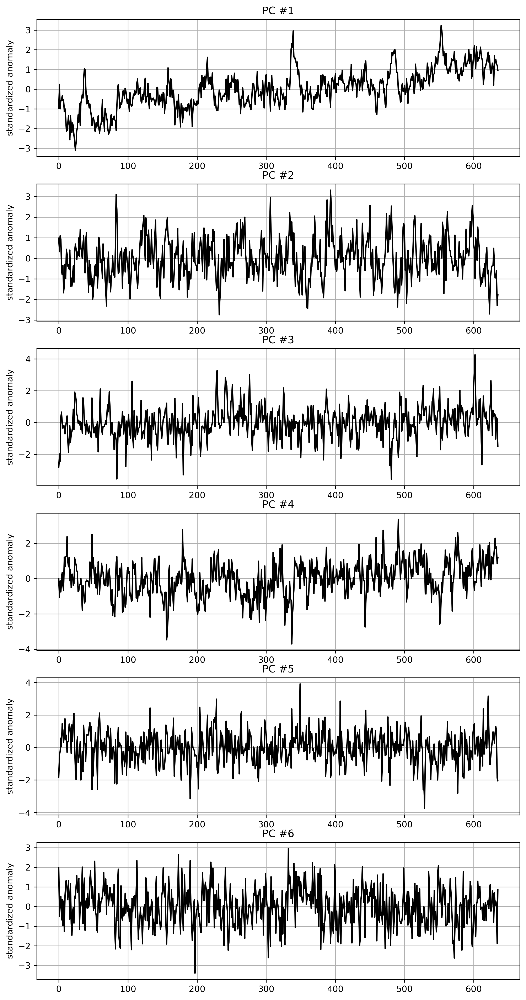

In [42]:
south_box = data_z_anom.sel(lat=slice(-45,-55),lon=slice(240,250)).mean(dim='lat').mean(dim='lon')
figure=plt.figure(figsize=(10,20),dpi=300)
for i in range(len(pcs.mode)):
    ax = plt.subplot(6,1,i+1)
    ax.plot(pcs.sel(mode=i),color='k',linewidth=1.5)
    ax.grid()
    ax.set_title('PC #'+str(i+1))
    ax.set_ylabel('standardized anomaly')
    #ax.plot(south_box/np.std(south_box),color='red')

plt.savefig('/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_EOFs/principal_component_time_series.png')

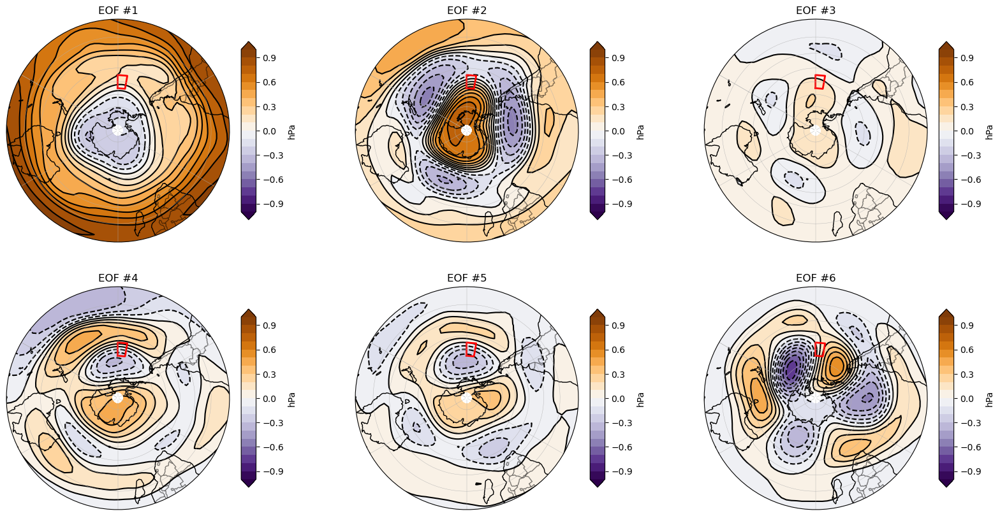

In [43]:
path_eof= '/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_EOFs'
lon = data.lon; lat=data.lat
fig_stereo_eofs(lon,lat,-10,eofs,np.arange(-1,1.1,.1),'1st EOF pattern - Geopotential Height 200hPa','hPa',[240,250,-55,-45],path_eof)

In [1]:
pcs_detrend

NameError: name 'pcs_detrend' is not defined

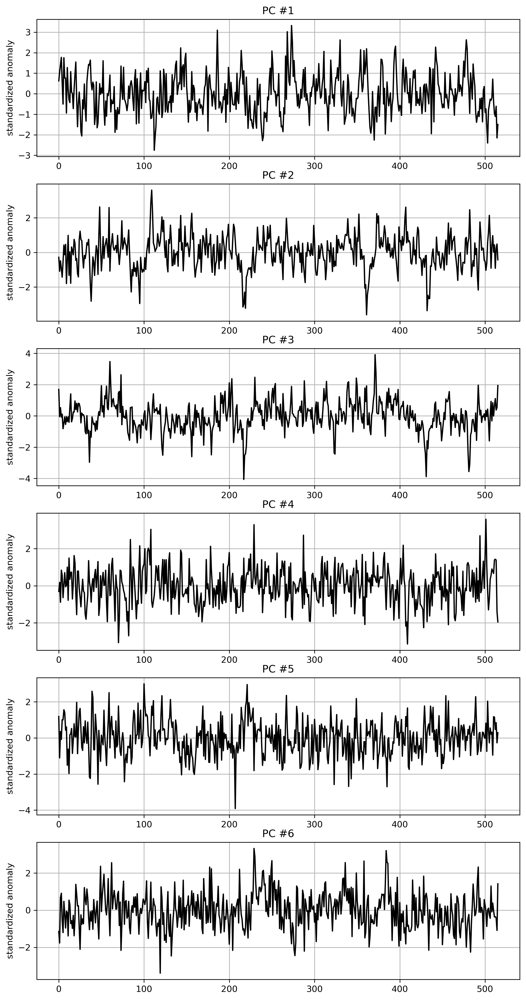

In [103]:
south_box = data_z_anom.sel(lat=slice(-45,-55),lon=slice(240,250)).mean(dim='lat').mean(dim='lon')
figure=plt.figure(figsize=(10,20),dpi=300)
for i in range(len(pcs_detrend.mode)):
    ax = plt.subplot(6,1,i+1)
    ax.plot(pcs_detrend.sel(mode=i),color='k',linewidth=1.5)
    ax.grid()
    ax.set_title('PC #'+str(i+1))
    ax.set_ylabel('standardized anomaly')
    #ax.plot(south_box/np.std(south_box),color='red')

plt.savefig('/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_EOFs/principal_component_time_series_annua_detrend.png')

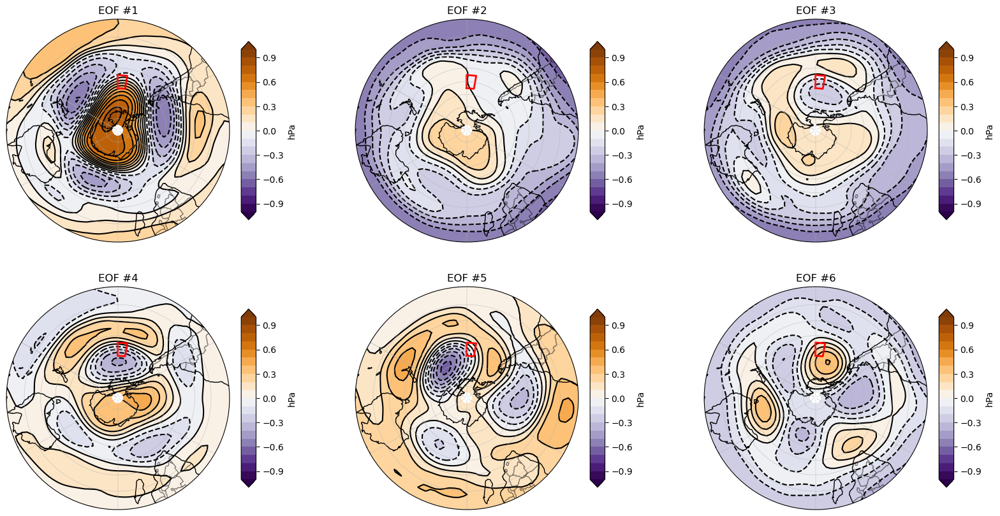

In [104]:
path_eof= '/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_EOFs'
lon = data.lon; lat=data.lat
fig_stereo_eofs(lon,lat,-10,eofs_detrend,np.arange(-1,1.1,.1),'EOF patterns - detrended Geopotential Height 200hPa','hPa',[240,250,-55,-45],path_eof)

### Projection onto EOFs

In [136]:
pcs_df = pd.DataFrame({'mode '+str(i):pcs.sel(mode=i) for i in range(len(pcs.mode))})
std_south_box = south_box/np.std(south_box)
MLR = multiple_linear_regression(std_south_box.values,pcs_df)
MLR_pval = multiple_linear_regression_pval(std_south_box.values,pcs_df)

In [137]:
MLR_pval

(0.9999683622230484,
 0.0382612558172542,
 0.017489344250086976,
 0.011824327747202077,
 0.43240582125266946,
 0.10666725732839748,
 0.019497606006933312)

In [138]:
MLR

(5.022030353005191e-06,
 -0.27374826552923287,
 -0.3170071841738422,
 -0.33750751669478823,
 -0.1010464007502372,
 0.2105922588322511,
 -0.31119359470029756)

In [157]:
reproduced_anom = pcs.sel(mode=0)*(MLR[1]) + pcs.sel(mode=1)*(MLR[2]) + pcs.sel(mode=2)*(MLR[3]) + pcs.sel(mode=3)*(MLR[4])  + pcs.sel(mode=4)*(MLR[5]) + pcs.sel(mode=5)*(MLR[6])  
reproduced_anom_first_two = pcs.sel(mode=0)*(MLR[1]) + pcs.sel(mode=1)*(MLR[2])
reproduced_anom_first = pcs.sel(mode=1)*(MLR[2])


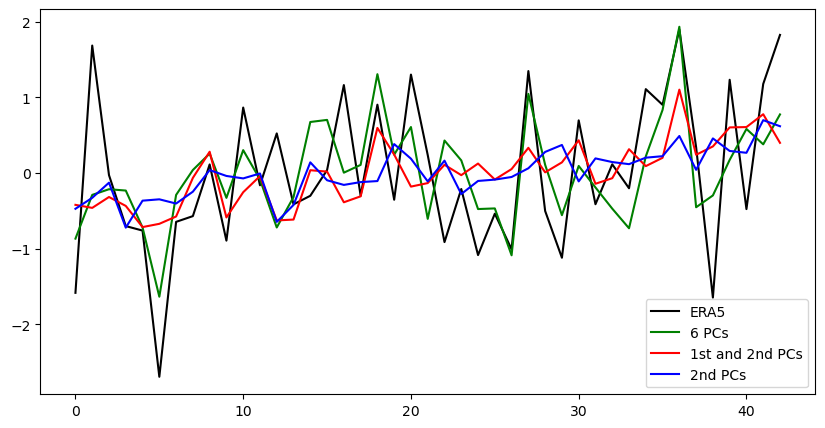

In [161]:
fig= plt.figure(figsize=(10,5))
plt.plot(south_box/np.std(south_box),color='k',linestyle='-',label = 'ERA5')
plt.plot(reproduced_anom,color='green',linestyle='-',label = '6 PCs')
plt.plot(reproduced_anom_first_two,color='red',label = '1st and 2nd PCs')
plt.plot(reproduced_anom_first,color='blue',label = '2nd PCs')
plt.legend()

### Funcion corriente

In [143]:
sf_array = data_annual_eof.z.isel(expver=0).copy()

In [148]:
sf_array

<xarray.DataArray 'z' (time: 84, lat: 64, lon: 128)>
array([[[  3812.175 ,   3815.03  ,   3818.2744, ...,   3803.7224,
           3806.545 ,   3809.2986],
        [  3754.2307,   3760.2617,   3766.84  , ...,   3737.7454,
           3742.8936,   3748.3965],
        [  3659.0488,   3666.4094,   3674.7737, ...,   3642.2908,
           3647.0535,   3652.552 ],
        ...,
        [ -4733.675 ,  -4765.434 ,  -4796.016 , ...,  -4630.0645,
          -4665.6274,  -4700.413 ],
        [ -4726.9263,  -4746.9565,  -4766.5645, ...,  -4663.8022,
          -4685.197 ,  -4706.2144],
        [ -4725.2173,  -4733.1753,  -4741.0444, ...,  -4701.1274,
          -4709.273 ,  -4717.273 ]],

       [[  3687.676 ,   3690.886 ,   3694.287 , ...,   3677.2917,
           3680.8489,   3684.2695],
        [  3717.4158,   3724.5159,   3731.6982, ...,   3695.7253,
           3702.9485,   3710.1038],
        [  3722.9434,   3732.259 ,   3741.759 , ...,   3695.8015,
           3704.7239,   3713.702 ],
...
        [ -4563.997 ,  -4580.9136,  -4596.8447, ...,  -4507.3438,
          -4526.964 ,  -4545.9453],
        [ -4577.3027,  -4587.232 ,  -4596.81  , ...,  -4545.6284,
          -4556.354 ,  -4566.885 ],
        [ -4603.161 ,  -4606.489 ,  -4609.931 , ...,  -4593.3916,
          -4596.6587,  -4599.826 ]],

       [[-15053.329 , -15053.134 , -15052.891 , ..., -15054.074 ,
         -15053.659 , -15053.531 ],
        [-15000.789 , -14999.1455, -14997.612 , ..., -15005.422 ,
         -15003.716 , -15002.406 ],
        [-14994.315 , -14989.483 , -14984.2295, ..., -15005.188 ,
         -15002.081 , -14998.579 ],
        ...,
        [-21460.02  , -21480.078 , -21499.744 , ..., -21398.434 ,
         -21418.94  , -21439.604 ],
        [-21473.635 , -21485.06  , -21496.49  , ..., -21439.04  ,
         -21450.342 , -21461.94  ],
        [-21499.395 , -21503.156 , -21507.031 , ..., -21488.31  ,
         -21491.986 , -21495.576 ]]], dtype=float32)
Coordinates:
  * lon      (lon) float64 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * lat      (lat) float64 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86
    expver   int32 1
    month    int64 1
  * time     (time) int64 1940 1941 1942 1943 1944 ... 2019 2020 2021 2022 2023

In [147]:
sf_annual.shape

(64, 128, 84)

In [150]:
sf_array.values = sf_annual.reshape(84, 64, 128)

In [152]:
eofs,pcs = eof_solver(sf_array.fillna(0))

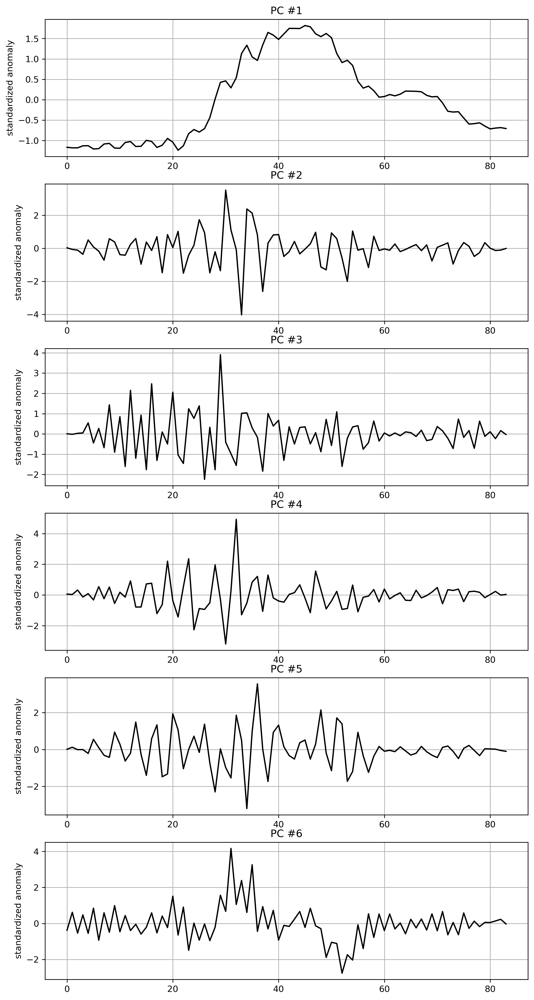

In [153]:
south_box = data_z_anom.sel(lat=slice(-45,-55),lon=slice(240,250)).mean(dim='lat').mean(dim='lon')
figure=plt.figure(figsize=(10,20),dpi=300)
for i in range(len(pcs.mode)):
    ax = plt.subplot(6,1,i+1)
    ax.plot(pcs.sel(mode=i),color='k',linewidth=1.5)
    ax.grid()
    ax.set_title('PC #'+str(i+1))
    ax.set_ylabel('standardized anomaly')
    #ax.plot(south_box/np.std(south_box),color='red')


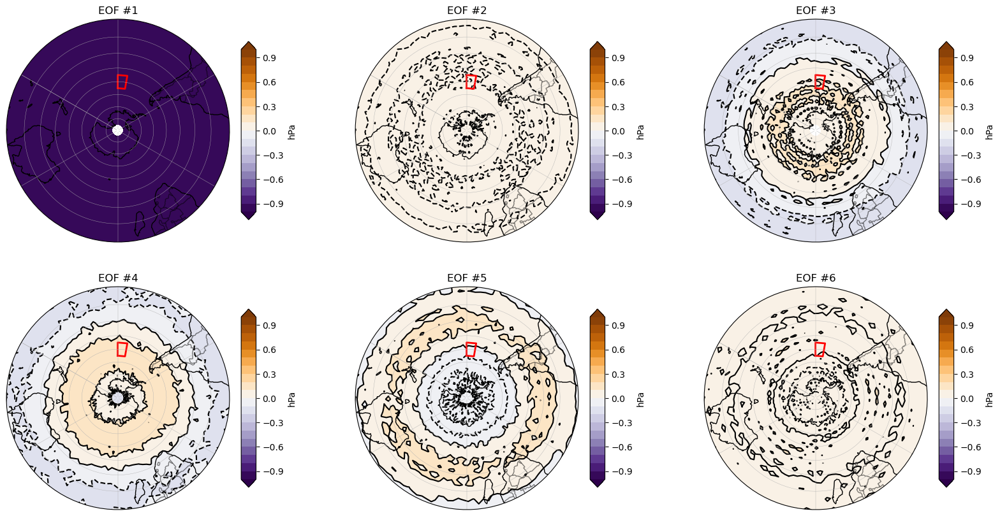

In [154]:
path_eof= '/Users/juliamindlin/Dropbox/Julia_presentaciones_y_papers/SouthernOceanCoolin/figures_EOFs'
fig_stereo_eofs(lon,lat,-10,eofs,np.arange(-1,1.1,.1),'1st EOF pattern - Stream function 200hPa','hPa',[240,250,-55,-45],path_eof)